# Task 1 Solution for Data preparation and customer analytics : Forage Quantium

In [1]:
import pandas as pd
import datetime

import seaborn as sns
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt

import re

## Table 1: Transaction Dataset

In [2]:
df = pd.read_csv("qviTransactionData.csv")

In [3]:
df.head(10)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
5,43604,4,4074,2982,57,Old El Paso Salsa Dip Tomato Mild 300g,1,5.1
6,43601,4,4149,3333,16,Smiths Crinkle Chips Salt & Vinegar 330g,1,5.7
7,43601,4,4196,3539,24,Grain Waves Sweet Chilli 210g,1,3.6
8,43332,5,5026,4525,42,Doritos Corn Chip Mexican Jalapeno 150g,1,3.9
9,43330,7,7150,6900,52,Grain Waves Sour Cream&Chives 210G,2,7.2


In [4]:
df.tail()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8
264835,43365,272,272380,270189,74,Tostitos Splash Of Lime 175g,2,8.8


In [5]:
df.shape

(264836, 8)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DATE            264836 non-null  int64  
 1   STORE_NBR       264836 non-null  int64  
 2   LYLTY_CARD_NBR  264836 non-null  int64  
 3   TXN_ID          264836 non-null  int64  
 4   PROD_NBR        264836 non-null  int64  
 5   PROD_NAME       264836 non-null  object 
 6   PROD_QTY        264836 non-null  int64  
 7   TOT_SALES       264836 non-null  float64
dtypes: float64(1), int64(6), object(1)
memory usage: 16.2+ MB


In [7]:
df.dtypes

DATE                int64
STORE_NBR           int64
LYLTY_CARD_NBR      int64
TXN_ID              int64
PROD_NBR            int64
PROD_NAME          object
PROD_QTY            int64
TOT_SALES         float64
dtype: object

It is clear that the DATE column contains numerical data type (int64) instead of date. Furthermore, the PROD_NAME column has more than just the product name. Let us proceed with further investigation before handling the previous issues.

In [8]:
df.isnull().sum()

DATE              0
STORE_NBR         0
LYLTY_CARD_NBR    0
TXN_ID            0
PROD_NBR          0
PROD_NAME         0
PROD_QTY          0
TOT_SALES         0
dtype: int64

dataset has no null values

In [9]:
df.count()

DATE              264836
STORE_NBR         264836
LYLTY_CARD_NBR    264836
TXN_ID            264836
PROD_NBR          264836
PROD_NAME         264836
PROD_QTY          264836
TOT_SALES         264836
dtype: int64

In [10]:
df.nunique()

DATE                 364
STORE_NBR            272
LYLTY_CARD_NBR     72637
TXN_ID            263127
PROD_NBR             114
PROD_NAME            114
PROD_QTY               6
TOT_SALES            112
dtype: int64

In [11]:
len(df)

264836

The unique values here for TXN_ID here is less than the number of rows of Transaction Data, which means a customer could buy multiple brands of chips in a single transacton i.e. duplicates present. Let us look for duplicates in the TXN_ID.

In [12]:
df[df.duplicated(['TXN_ID'])].head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
42,43605,55,55073,48887,113,Twisties Chicken270g,1,4.6
377,43475,7,7364,7739,20,Doritos Cheese Supreme 330g,2,11.4
419,43391,12,12301,10982,93,Doritos Corn Chip Southern Chicken 150g,2,7.8
476,43351,16,16427,14546,81,Pringles Original Crisps 134g,1,3.7
511,43315,19,19272,16683,31,Infzns Crn Crnchers Tangy Gcamole 110g,2,7.6


In [13]:
df['TXN_ID'] == 48887

0         False
1         False
2         False
3         False
4         False
          ...  
264831    False
264832    False
264833    False
264834    False
264835    False
Name: TXN_ID, Length: 264836, dtype: bool

In [14]:
# :represents all columns
df.loc[df['TXN_ID'] == 48887, :]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
41,43605,55,55073,48887,4,Dorito Corn Chp Supreme 380g,1,3.25
42,43605,55,55073,48887,113,Twisties Chicken270g,1,4.60


The above outcomes tell us that in the same date, from the same store, and by the same customer two different chips have been bought.

### Summary of Statistics

In [15]:
df.describe()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,264836.000000,264836.00000,2.648360e+05,2.648360e+05,264836.000000,264836.000000,264836.000000
mean,43464.036260,135.08011,1.355495e+05,1.351583e+05,56.583157,1.907309,7.304200
std,105.389282,76.78418,8.057998e+04,7.813303e+04,32.826638,0.643654,3.083226
min,43282.000000,1.00000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.500000
25%,43373.000000,70.00000,7.002100e+04,6.760150e+04,28.000000,2.000000,5.400000
50%,43464.000000,130.00000,1.303575e+05,1.351375e+05,56.000000,2.000000,7.400000
75%,43555.000000,203.00000,2.030942e+05,2.027012e+05,85.000000,2.000000,9.200000
max,43646.000000,272.00000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


### Data Types

#### DATE Column

In [16]:
df["DATE"].head()

0    43390
1    43599
2    43605
3    43329
4    43330
Name: DATE, dtype: int64

We will have to adjust the date format. 5 digits date format

In [17]:
def Excel5DigitsDate_to_Date(FDate):
    excel_anchor = datetime.datetime(1900, 1, 1)
    if(FDate < 60):
        delta_in_days = datetime.timedelta(days = (FDate - 1))
    else:
        delta_in_days = datetime.timedelta(days = (FDate - 2))
    converted_date = excel_anchor + delta_in_days
    return converted_date

In [18]:
df['DATE'] = df['DATE'].apply(Excel5DigitsDate_to_Date)
df.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


In [19]:
df['PROD_NAME'].head()

0      Natural Chip        Compny SeaSalt175g
1                    CCs Nacho Cheese    175g
2      Smiths Crinkle Cut  Chips Chicken 170g
3      Smiths Chip Thinly  S/Cream&Onion 175g
4    Kettle Tortilla ChpsHny&Jlpno Chili 150g
Name: PROD_NAME, dtype: object

In [20]:
df['PACK_SIZE'] = df.PROD_NAME.str.extract('(\d+)')
df.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150


In [21]:
df.dtypes

DATE              datetime64[ns]
STORE_NBR                  int64
LYLTY_CARD_NBR             int64
TXN_ID                     int64
PROD_NBR                   int64
PROD_NAME                 object
PROD_QTY                   int64
TOT_SALES                float64
PACK_SIZE                 object
dtype: object

The PACK_SIZE Column has a string data type and needs to be converted to numeric.

In [22]:
df['PACK_SIZE'] = pd.to_numeric(df['PACK_SIZE'])
df['PACK_SIZE'].dtypes

dtype('int64')

In [23]:
# This is how '/' and '&' can be removed from a text
re.sub('[&/]', ' ', 'Smiths Chip Thinly S/Cream&Onion 175g')

'Smiths Chip Thinly S Cream Onion 175g'

In [24]:
# This is how a weight at the end of the text can be removed
re.sub('\d\w*', ' ', 'Smiths Chip Thinly S/Cream&Onion 175g')

'Smiths Chip Thinly S/Cream&Onion  '

In [25]:
def extract_text(text):

    
    text = re.sub('[&/]', ' ', text) # Remove special characters '&' and '/'
    text = re.sub('\d\w*', ' ', text) # Remove product weights
    
    return text

# Apply text cleaning function to PROD_NAME column
df['PROD_NAME'] = df['PROD_NAME'].apply(extract_text)
df.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt,2,6.0,175
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese,3,6.3,175
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken,2,2.9,170
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S Cream Onion,5,15.0,175
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny Jlpno Chili,3,13.8,150


remove & and \

Let us extract the brand name which is the first word in the PROD_NAME and then save it in a separate column.

In [26]:
df['PROD_NAME'].str.partition().head()

,0,1,2
0,Natural,,Chip Compny SeaSalt
1,CCs,,Nacho Cheese
2,Smiths,,Crinkle Cut Chips Chicken
3,Smiths,,Chip Thinly S Cream Onion
4,Kettle,,Tortilla ChpsHny Jlpno Chili


In [27]:
df['PROD_NAME'].str.partition()[0].head()

0    Natural
1        CCs
2     Smiths
3     Smiths
4     Kettle
Name: 0, dtype: object

In [28]:
parts = df['PROD_NAME'].str.partition()
df['BRAND'] = parts[0]
df.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE,BRAND
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt,2,6.0,175,Natural
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese,3,6.3,175,CCs
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken,2,2.9,170,Smiths
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S Cream Onion,5,15.0,175,Smiths
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny Jlpno Chili,3,13.8,150,Kettle


In [29]:
df['BRAND'].unique()

array(['Natural', 'CCs', 'Smiths', 'Kettle', 'Old', 'Grain', 'Doritos',
       'Twisties', 'WW', 'Thins', 'Burger', 'NCC', 'Cheezels', 'Infzns',
       'Red', 'Pringles', 'Dorito', 'Infuzions', 'Smith', 'GrnWves',
       'Tyrrells', 'Cobs', 'Woolworths', 'French', 'RRD', 'Tostitos',
       'Cheetos', 'Snbts', 'Sunbites'], dtype=object)

We need to rename some brands here as they have the same names.

In [30]:
df['BRAND'].replace('Ncc', 'Natural', inplace = True)
df['BRAND'].replace('Ccs', 'CCS', inplace = True)
df['BRAND'].replace('Smith', 'Smiths', inplace = True)
df['BRAND'].replace(['Grain', 'Grnwves'], 'Grainwaves', inplace = True)
df['BRAND'].replace('Dorito', 'Doritos', inplace = True)
df['BRAND'].replace('Ww', 'Woolworths', inplace = True)
df['BRAND'].replace('Infzns', 'Infuzions', inplace = True)
df['BRAND'].replace(['Red', 'Rrd'], 'Red Rock Deli', inplace = True)
df['BRAND'].replace('Snbts', 'Sunbites', inplace = True)

df['BRAND'].unique()

array(['Natural', 'CCs', 'Smiths', 'Kettle', 'Old', 'Grainwaves',
       'Doritos', 'Twisties', 'WW', 'Thins', 'Burger', 'NCC', 'Cheezels',
       'Infuzions', 'Red Rock Deli', 'Pringles', 'GrnWves', 'Tyrrells',
       'Cobs', 'Woolworths', 'French', 'RRD', 'Tostitos', 'Cheetos',
       'Sunbites'], dtype=object)

### Outliers

#### Let us investigate the columns to check for outliers before proceeding with further analysis. 

In [31]:
df['PROD_QTY'].unique()

array([  2,   3,   5,   1,   4, 200], dtype=int64)

In [32]:
df['PROD_QTY'].value_counts()

2      236039
1       27518
5         450
3         430
4         397
200         2
Name: PROD_QTY, dtype: int64

As it is obvious that we have two times when the 200 value showed up

In [33]:
df.loc[df['PROD_QTY'] == 200, :]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE,BRAND
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme,200,650.0,380,Doritos
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme,200,650.0,380,Doritos


It seems the person with card number 226000 has made the above transaction and at the same store. Let us check his other transactions.

In [34]:
df.loc[df['LYLTY_CARD_NBR'] == 226000, :]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE,BRAND
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme,200,650.0,380,Doritos
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme,200,650.0,380,Doritos


Interestingly, this person has only made two transactions and therefore he is far away from being a retail customer. We can remove his records from our dataset and consider PROD_QTY Column cleaned from outliers. 

In [35]:
df.index[df['LYLTY_CARD_NBR'] == 226000]

Int64Index([69762, 69763], dtype='int64')

In [36]:
df.drop([69762, 69763],inplace=True)
df.index[df['LYLTY_CARD_NBR'] == 226000]

Int64Index([], dtype='int64')

#### STORE_NBR

C:\Users\simmy\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='STORE_NBR', ylabel='Density'>

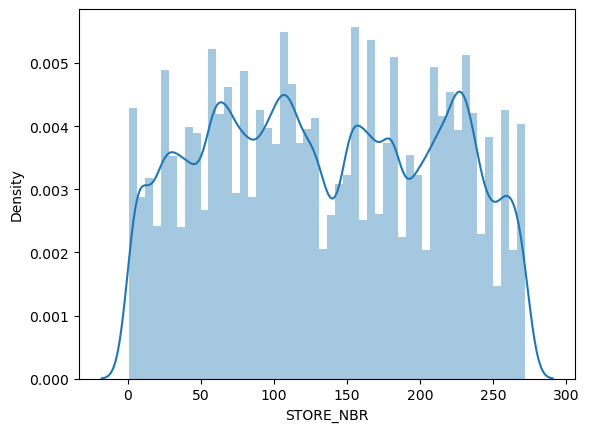

In [37]:
sns.distplot(df['STORE_NBR'])

#### LYLTY_CARD_NBR

In [38]:
df['LYLTY_CARD_NBR'].value_counts()

172032    18
162039    18
13138     17
230078    17
128178    17
          ..
22190      1
22138      1
22099      1
22089      1
272380     1
Name: LYLTY_CARD_NBR, Length: 72636, dtype: int64

C:\Users\simmy\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LYLTY_CARD_NBR', ylabel='Density'>

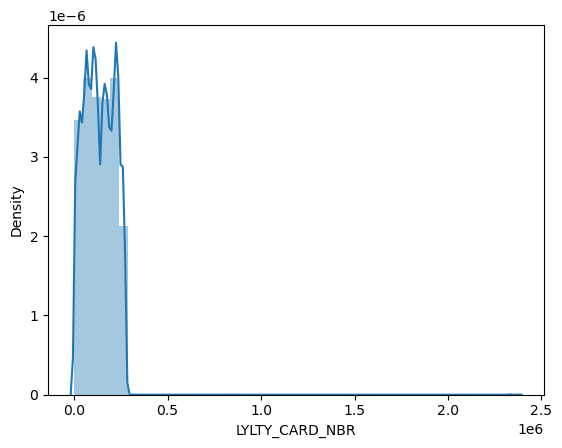

In [39]:
sns.distplot(df['LYLTY_CARD_NBR'])

The histogram is skewed to the right. This illustrates that there are customers which are less loyal where they have not bought except few times from the stores.

<AxesSubplot:xlabel='LYLTY_CARD_NBR'>

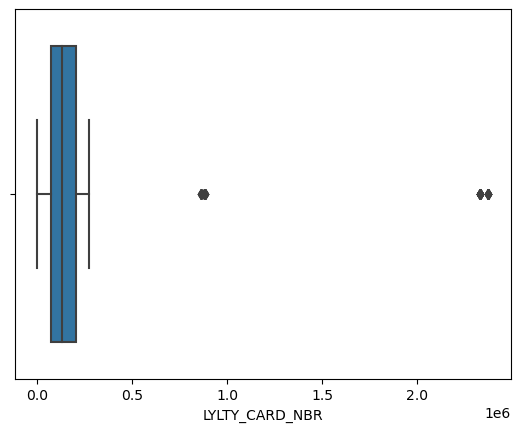

In [40]:
sns.boxplot(x=df['LYLTY_CARD_NBR'])

We can use this data to find why these customers are not loyal.

#### PROD_NBR

In [41]:
df['PROD_NBR'].value_counts()

102    3304
108    3296
33     3269
112    3268
75     3265
       ... 
11     1431
76     1430
98     1419
29     1418
72     1410
Name: PROD_NBR, Length: 114, dtype: int64

C:\Users\simmy\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PROD_NBR', ylabel='Density'>

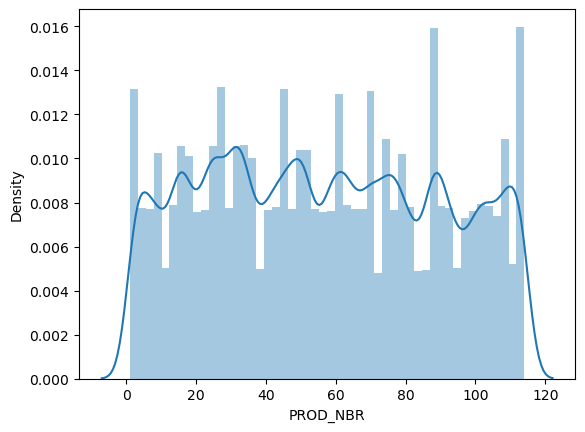

In [42]:
sns.distplot(df['PROD_NBR'])

In [43]:
df['TOT_SALES'].value_counts()

9.2     22821
7.4     22513
6.0     20798
7.6     20212
8.8     19900
        ...  
15.5        3
9.3         3
6.9         3
12.4        2
11.2        2
Name: TOT_SALES, Length: 111, dtype: int64

C:\Users\simmy\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TOT_SALES', ylabel='Density'>

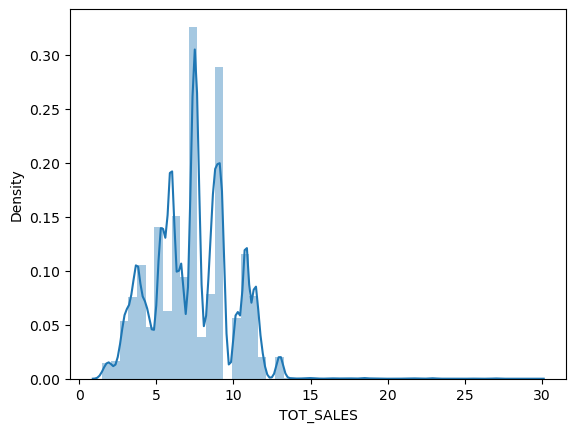

In [44]:
sns.distplot(df['TOT_SALES'])

The ditribution plot is skewed to right. As the price increase, it is less likely for the customer to buy the product. Anyway, as the quantity of the product increases, the total price goes up as well. 

<AxesSubplot:xlabel='TOT_SALES'>

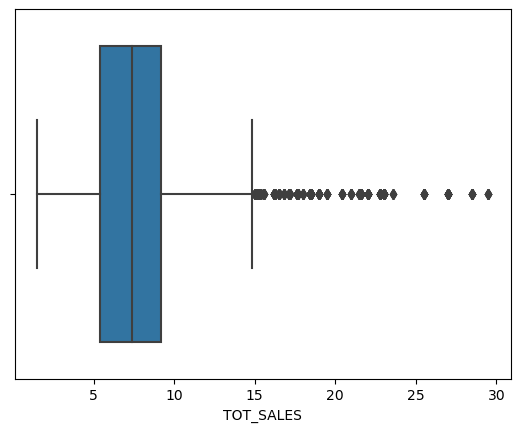

In [45]:
sns.boxplot(x=df['TOT_SALES'])

For now, we will keep these outiers as they might mean something and to investigate the total sales relationship with some other variables and latter we will decide to remove them or keep them.

#### PACK_SIZE

In [46]:
df['PACK_SIZE'].value_counts()

175    66390
150    43131
134    25102
110    22387
170    19983
165    15297
300    15166
330    12540
380     6416
270     6285
210     6272
200     4473
135     3257
250     3169
90      3008
190     2995
160     2970
220     1564
70      1507
180     1468
125     1454
Name: PACK_SIZE, dtype: int64

C:\Users\simmy\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PACK_SIZE', ylabel='Density'>

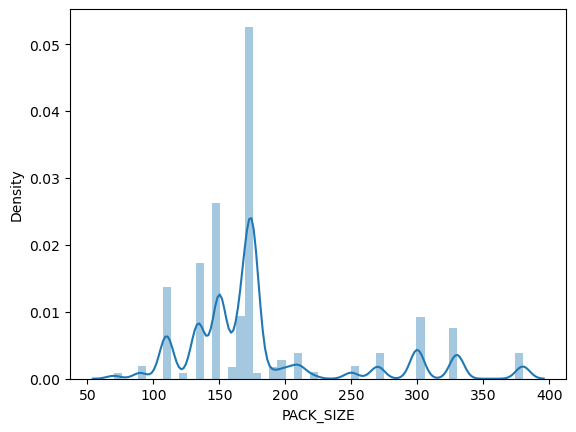

In [47]:
sns.distplot(df['PACK_SIZE'])

<AxesSubplot:xlabel='PACK_SIZE'>

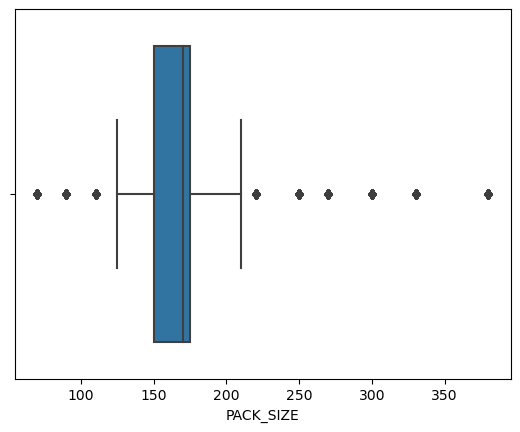

In [48]:
sns.boxplot(x=df['PACK_SIZE'])

#### BRAND

In [49]:
df['BRAND'].value_counts()

Kettle           41288
Smiths           31823
Doritos          28145
Pringles         25102
Infuzions        14201
Thins            14075
RRD              11894
WW               10320
Cobs              9693
Tostitos          9471
Twisties          9454
Old               9324
Tyrrells          6442
Grainwaves        6272
Natural           6050
Red Rock Deli     5885
Cheezels          4603
CCs               4551
Woolworths        4437
Sunbites          3008
Cheetos           2927
Burger            1564
GrnWves           1468
NCC               1419
French            1418
Name: BRAND, dtype: int64

In [50]:
df["DATE"].nunique()

364

This is showing a whole year almost (minus one day which is not a big deal).

### Studying the Relationships between the Features

We will focus more here on the Total_Sales Feature and how are the rest of the variables affecting it. Let us start with using pairplot and heat map in order to obtain a quick glance at the different features' behaviour versus each other.  

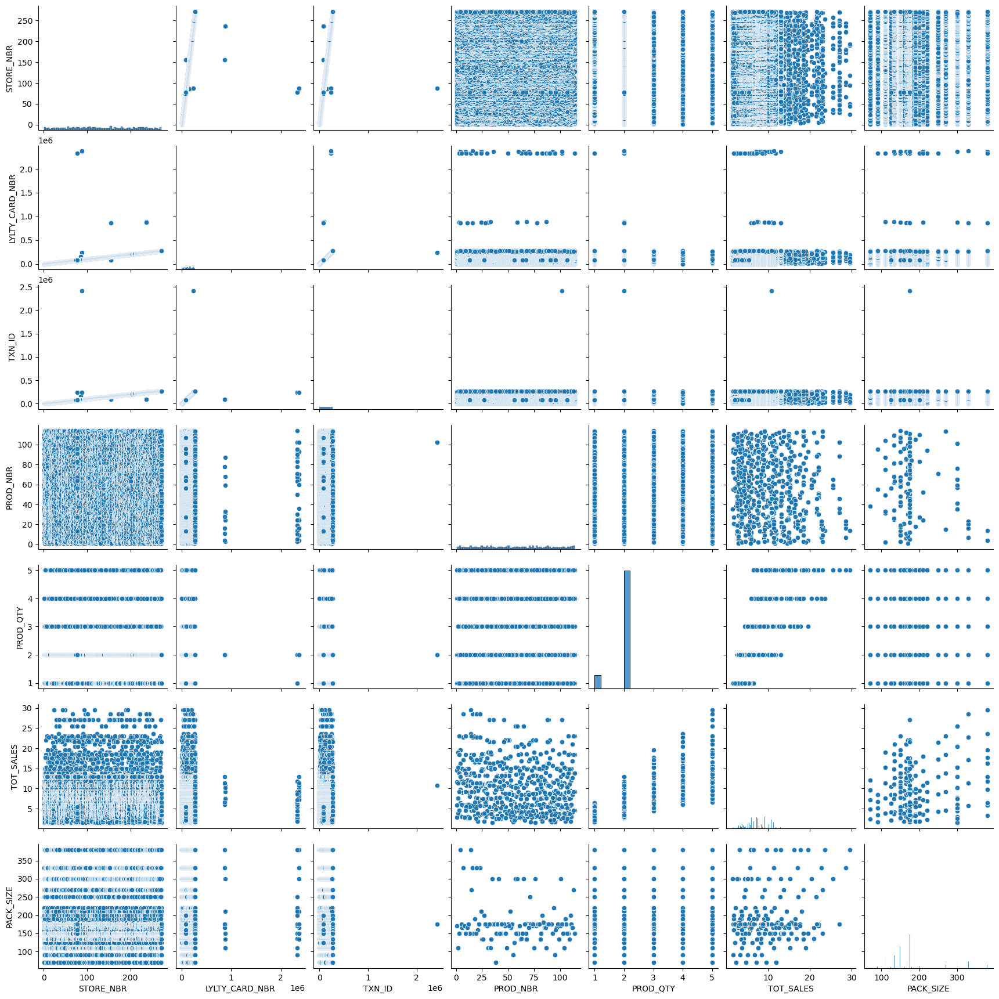

In [51]:
sns.pairplot(df)

<AxesSubplot:>

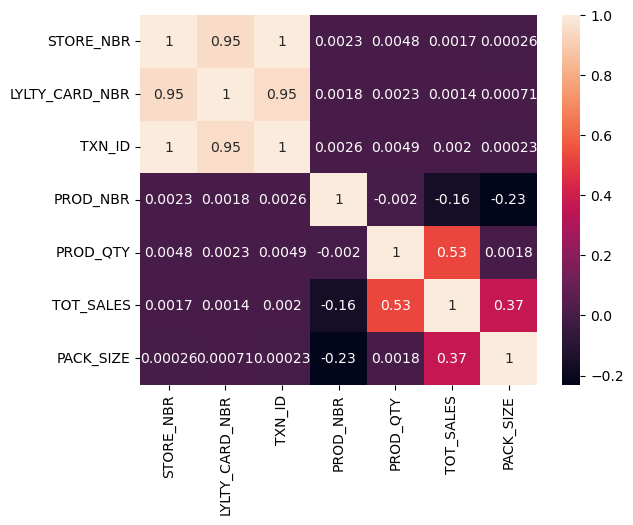

In [52]:
sns.heatmap(df.corr(), annot=True)

The above two figures where just to provide a breif analysis of how the variables interact with each other.

Let us examine the the effect and relationship of the features presented in the Transaction Dataset against the Total Sales.

#### Date vs Total Sales

We will need to create a separate pivot table and we put the date as an index and total sales as a target feature. This is a proper step before handling a time series data.

In [53]:
pt = pd.pivot_table(df,values='TOT_SALES',index='DATE',aggfunc='sum')
pt

,TOT_SALES
DATE,
2018-07-01,5372.2
2018-07-02,5315.4
2018-07-03,5321.8
2018-07-04,5309.9
2018-07-05,5080.9
...,...
2019-06-26,5305.0
2019-06-27,5202.8
2019-06-28,5299.6


In [54]:
fig = px.line(pt, y="TOT_SALES")
fig.show()

We can see that the total sales peak at around the mid of Dec 2018 and this can be explained by the time where there is christmas activites taking place and people would like to buy more food including chips kids and have fun. 

#### Product Quantity & Pack Size vs Total Sales

We have already seen from the pairplot and heat map above that Product Quantity & Pack Size have direct impact of the total sales and it is very logical. We can examine their relationship with the total sales by 3D scatter plot.

In [55]:
fig = px.scatter_3d(df, x='PROD_QTY', y='TOT_SALES', z='PACK_SIZE')
fig.show()

#### Brand vs Total Sales

Here we have a brand feature which a categorical variable and was not presented in the pairplot or the heat map above. We can group the total sales by the different brands and then draw a bar chart to compare the highest brand sold.

In [56]:
gr = df.groupby('BRAND').TOT_SALES.sum()
gr

BRAND
Burger             6831.0
CCs               18078.9
Cheetos           16884.5
Cheezels          40029.9
Cobs              70569.8
Doritos          240590.9
French             7929.0
Grainwaves        43048.8
GrnWves            8568.4
Infuzions         99047.6
Kettle           390239.8
NCC                8046.0
Natural           34272.0
Old               90785.1
Pringles         177655.5
RRD               64954.5
Red Rock Deli     30091.5
Smiths           224660.2
Sunbites           9676.4
Thins             88852.5
Tostitos          79789.6
Twisties          81522.1
Tyrrells          51647.4
WW                35889.5
Woolworths        13454.1
Name: TOT_SALES, dtype: float64

In [57]:
gr_df = gr.to_frame()
gr_df.reset_index(inplace=True)

In [58]:
gr_df.head()

,BRAND,TOT_SALES
0,Burger,6831.0
1,CCs,18078.9
2,Cheetos,16884.5
3,Cheezels,40029.9
4,Cobs,70569.8


In [59]:
fig = px.bar(gr_df, x='BRAND', y='TOT_SALES')
fig.show()

The highest total sales goes to Kettle and then to Doritos and Smiths. Burger, French, GrnWves, NCC, Sunbites and Woolworths have the lowest total sales.

It is worth mentioning here that there were outliers in some features like Pack_Siza and Total_Sales but we kept them as their existance was important for the anaylsis and study of the different variables effects.

## Table 2: Customer Purchasing Behaviour

In [60]:
# dfc will be a shortcut for dataframe of the customer purchasing behaviour dataset
# reading the table from csv file into pandas dataframe

dfc = pd.read_csv("QVI_purchase_behaviour.csv")

dfc.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


### Exploratory Data Analysis and Feature Engineering

In [61]:
dfc.shape

(72637, 3)

In [62]:
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [63]:
dfc.dtypes

LYLTY_CARD_NBR       int64
LIFESTAGE           object
PREMIUM_CUSTOMER    object
dtype: object

In [64]:
dfc.isnull().sum()

LYLTY_CARD_NBR      0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

In [65]:
dfc.count()

LYLTY_CARD_NBR      72637
LIFESTAGE           72637
PREMIUM_CUSTOMER    72637
dtype: int64

In [66]:
dfc.nunique()

LYLTY_CARD_NBR      72637
LIFESTAGE               7
PREMIUM_CUSTOMER        3
dtype: int64

In [67]:
len(dfc) == dfc['LYLTY_CARD_NBR'].nunique()

True

In [68]:
dfc['LIFESTAGE'].unique()

array(['YOUNG SINGLES/COUPLES', 'YOUNG FAMILIES', 'OLDER SINGLES/COUPLES',
       'MIDAGE SINGLES/COUPLES', 'NEW FAMILIES', 'OLDER FAMILIES',
       'RETIREES'], dtype=object)

In [69]:
dfc['PREMIUM_CUSTOMER'].unique()

array(['Premium', 'Mainstream', 'Budget'], dtype=object)

In [70]:
dfc['LIFESTAGE'].value_counts()

RETIREES                  14805
OLDER SINGLES/COUPLES     14609
YOUNG SINGLES/COUPLES     14441
OLDER FAMILIES             9780
YOUNG FAMILIES             9178
MIDAGE SINGLES/COUPLES     7275
NEW FAMILIES               2549
Name: LIFESTAGE, dtype: int64

In [71]:
dfc['PREMIUM_CUSTOMER'].value_counts()

Mainstream    29245
Budget        24470
Premium       18922
Name: PREMIUM_CUSTOMER, dtype: int64

<AxesSubplot:xlabel='count', ylabel='LIFESTAGE'>

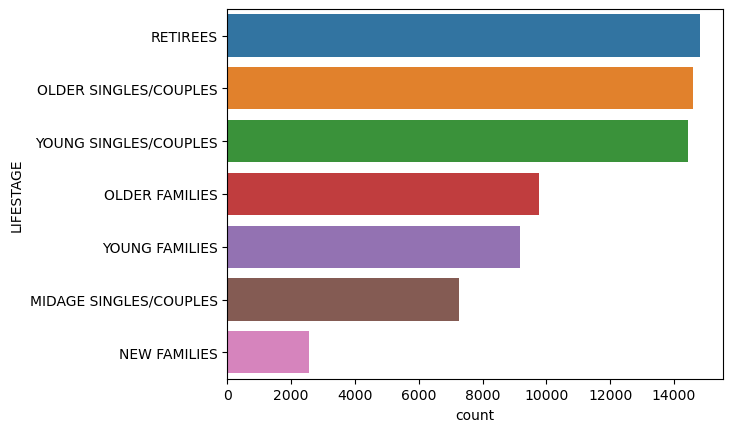

In [72]:
sns.countplot(y = dfc['LIFESTAGE'], order=dfc['LIFESTAGE'].value_counts().index)

### Summary of Statistics

In [73]:
dfc.describe(include='all')

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
count,7.263700e+04,72637,72637
unique,NaN,7,3
top,NaN,RETIREES,Mainstream
freq,NaN,14805,29245
mean,1.361859e+05,NaN,NaN
std,8.989293e+04,NaN,NaN
min,1.000000e+03,NaN,NaN
25%,6.620200e+04,NaN,NaN
50%,1.340400e+05,NaN,NaN
75%,2.033750e+05,NaN,NaN


### Combining the Transaction & Customer Purchasing Dataframes

We can either use join or merge operation for achieving the proper combination between the two table and since we have have only one column in common between the two tables which is LYLTY_CARD_NBR, it is safe to use merge() which is smart enough to join the two tables based on the only common column.  

In [74]:
com_dfs = pd.merge(df,dfc)
com_dfs.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE,BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2018-11-10,1,1307,346,96,WW Original Stacked Chips,2,3.8,160,WW,MIDAGE SINGLES/COUPLES,Budget
3,2019-03-09,1,1307,347,54,CCs Original,1,2.1,175,CCs,MIDAGE SINGLES/COUPLES,Budget
4,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget


In [75]:
com_dfs.shape

(264834, 12)

In [76]:
df.shape

(264834, 10)

In [77]:
dfc.shape

(72637, 3)

### Customer Segments

#### Number of Customers in Each Segment

We will group by PREMIUM_CUSTOMER and LIFESTAGE and choose the unique customers from the LYLTY_CARD_NBR.

In [78]:
com_dfs['LYLTY_CARD_NBR'].nunique()

72636

In [79]:
com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).LYLTY_CARD_NBR.nunique()

PREMIUM_CUSTOMER  LIFESTAGE             
Budget            MIDAGE SINGLES/COUPLES    1504
                  NEW FAMILIES              1112
                  OLDER FAMILIES            4675
                  OLDER SINGLES/COUPLES     4929
                  RETIREES                  4454
                  YOUNG FAMILIES            4017
                  YOUNG SINGLES/COUPLES     3779
Mainstream        MIDAGE SINGLES/COUPLES    3340
                  NEW FAMILIES               849
                  OLDER FAMILIES            2831
                  OLDER SINGLES/COUPLES     4930
                  RETIREES                  6479
                  YOUNG FAMILIES            2728
                  YOUNG SINGLES/COUPLES     8088
Premium           MIDAGE SINGLES/COUPLES    2431
                  NEW FAMILIES               588
                  OLDER FAMILIES            2273
                  OLDER SINGLES/COUPLES     4750
                  RETIREES                  3872
                  YOUNG FAMI

Let us put the above output into pandas dataframe.

In [80]:
cust_num = pd.DataFrame(com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).LYLTY_CARD_NBR.nunique())
cust_num.rename(columns={'LYLTY_CARD_NBR':'Customers'},inplace=True)
cust_num.sort_values(by='Customers',ascending=False, inplace=True)
cust_num

Customers
PREMIUM_CUSTOMER LIFESTAGE                        
Mainstream       YOUNG SINGLES/COUPLES        8088
                 RETIREES                     6479
                 OLDER SINGLES/COUPLES        4930
Budget           OLDER SINGLES/COUPLES        4929
Premium          OLDER SINGLES/COUPLES        4750
Budget           OLDER FAMILIES               4675
                 RETIREES                     4454
                 YOUNG FAMILIES               4017
Premium          RETIREES                     3872
Budget           YOUNG SINGLES/COUPLES        3779
Mainstream       MIDAGE SINGLES/COUPLES       3340
                 OLDER FAMILIES               2831
                 YOUNG FAMILIES               2728
Premium          YOUNG SINGLES/COUPLES        2574
                 YOUNG FAMILIES               2433
                 MIDAGE SINGLES/COUPLES       2431
                 OLDER FAMILIES               2273
Budget           MIDAGE SINGLES/COUPLES       1504
                 NEW FAMILIES                 1112
Mainstream       NEW FAMILIES                  849
Premium          NEW FAMILIES                  588

Let us visualize the cust_num dataframe by bar chart to have a better look at the different segments numbers. So far, we have used seaborn and plotly for drawing graphs. For this visualization, we will use pandas to draw a bar graph with from the cust_num dataframe which is consisting of MultiIndex.

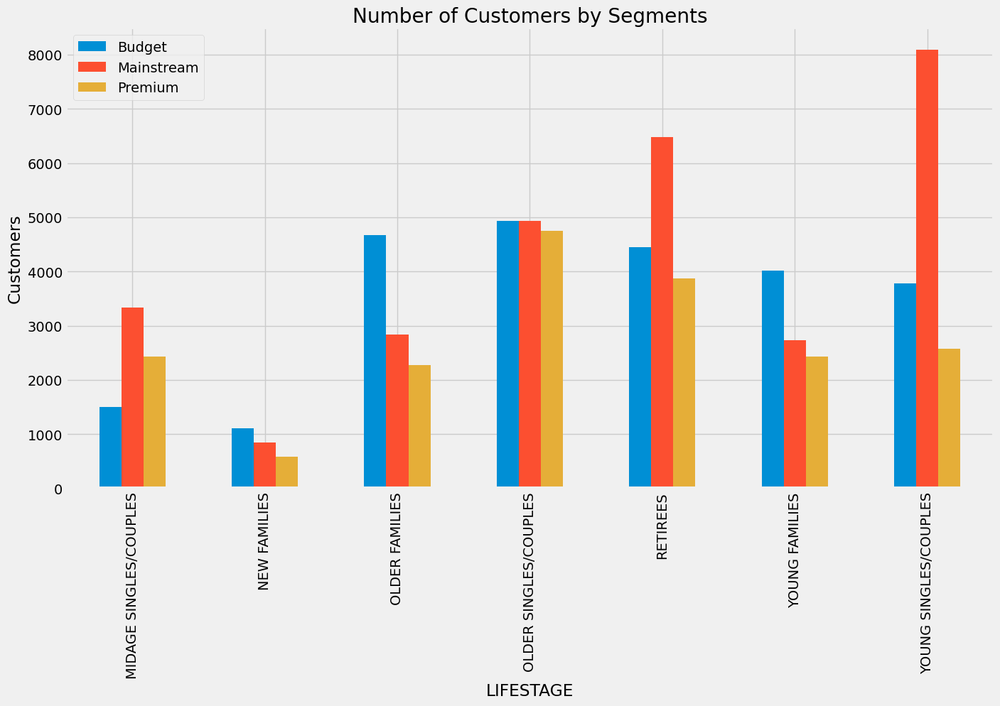

In [81]:
cust_plot = pd.DataFrame(com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).LYLTY_CARD_NBR.nunique())
matplotlib.style.use('fivethirtyeight')
cust_plot.unstack().plot(kind='bar', figsize=(15,8), title='Number of Customers by Segments')
plt.ylabel("Customers")
plt.legend(['Budget', 'Mainstream', 'Premium'])

As we can see that there are more mainstream young singles/couples and retirees. This contributes to more chips sales in these segments. However, this is not the major driver for the budget older families segment.

#### Customer Segments based on Products Quantity

We will basically follow the same procedures as for Number of Customers in Each Segment.

In [82]:
prod_qunt = pd.DataFrame(com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).PROD_QTY.sum())
prod_qunt.rename(columns={'PROD_QTY':'Product Quantity'},inplace=True)
prod_qunt.sort_values(by='Product Quantity',ascending=False, inplace=True)
prod_qunt

Product Quantity
PREMIUM_CUSTOMER LIFESTAGE                               
Budget           OLDER FAMILIES                     45065
Mainstream       RETIREES                           40518
                 YOUNG SINGLES/COUPLES              38632
Budget           YOUNG FAMILIES                     37111
                 OLDER SINGLES/COUPLES              35220
Mainstream       OLDER SINGLES/COUPLES              34997
Premium          OLDER SINGLES/COUPLES              33986
Budget           RETIREES                           28764
Mainstream       OLDER FAMILIES                     27756
                 YOUNG FAMILIES                     25044
Premium          RETIREES                           24884
Mainstream       MIDAGE SINGLES/COUPLES             22699
Premium          YOUNG FAMILIES                     22406
                 OLDER FAMILIES                     21771
Budget           YOUNG SINGLES/COUPLES              16671
Premium          MIDAGE SINGLES/COUPLES             15526
                 YOUNG SINGLES/COUPLES              11331
Budget           MIDAGE SINGLES/COUPLES              9496
                 NEW FAMILIES                        5571
Mainstream       NEW FAMILIES                        4319
Premium          NEW FAMILIES                        2957

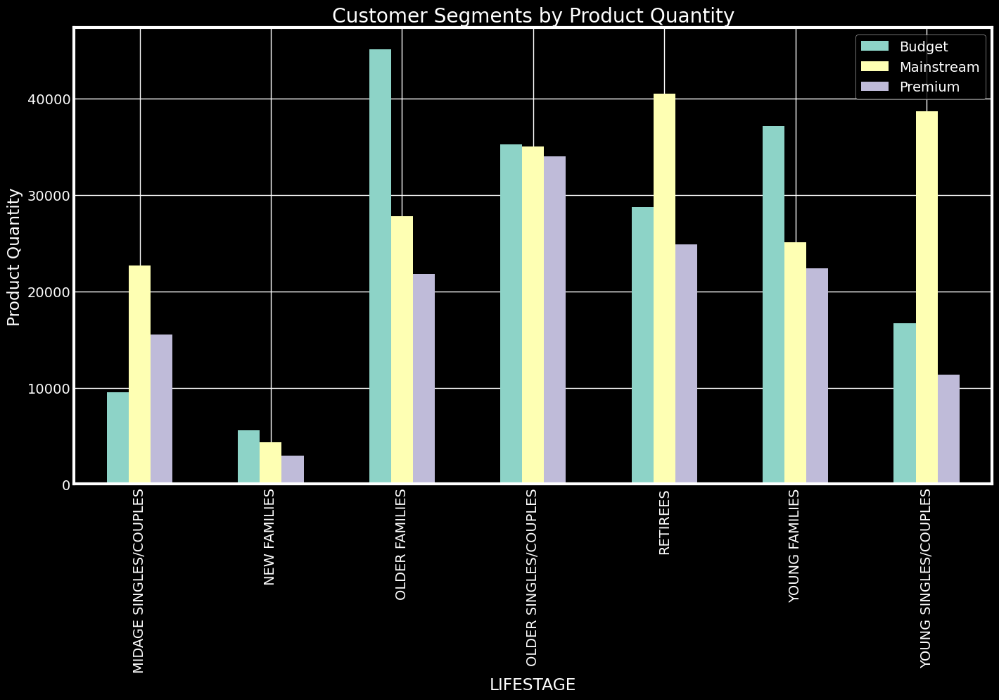

In [83]:
prod_plot = pd.DataFrame(com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).PROD_QTY.sum())
plt.style.use('dark_background')
prod_plot.unstack().plot(kind='bar', figsize=(15,8), title='Customer Segments by Product Quantity')
plt.ylabel("Product Quantity")
plt.legend(['Budget', 'Mainstream', 'Premium'])

surprisingly, the budget older families bought the highest quantity of the product even though their number is very low. New families in general bought the lowest amount of the product. However, as an overall trend, maintream has the highest number among the different lifestages with some exceptions. 

#### Customer Segments Based on Total Sales

In [84]:
cust_ts = pd.DataFrame(com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).TOT_SALES.sum())
cust_ts.rename(columns={'TOT_SALES':'Total Sales'},inplace=True)
cust_ts.sort_values(by='Total Sales',ascending=False, inplace=True)
cust_ts

Total Sales
PREMIUM_CUSTOMER LIFESTAGE                          
Budget           OLDER FAMILIES            168363.25
Mainstream       YOUNG SINGLES/COUPLES     157621.60
                 RETIREES                  155677.05
Budget           YOUNG FAMILIES            139345.85
                 OLDER SINGLES/COUPLES     136769.80
Mainstream       OLDER SINGLES/COUPLES     133393.80
Premium          OLDER SINGLES/COUPLES     132263.15
Budget           RETIREES                  113147.80
Mainstream       OLDER FAMILIES            103445.55
Premium          RETIREES                   97646.05
Mainstream       YOUNG FAMILIES             92788.75
                 MIDAGE SINGLES/COUPLES     90803.85
Premium          YOUNG FAMILIES             84025.50
                 OLDER FAMILIES             80658.40
Budget           YOUNG SINGLES/COUPLES      61141.60
Premium          MIDAGE SINGLES/COUPLES     58432.65
                 YOUNG SINGLES/COUPLES      41642.10
Budget           MIDAGE SINGLES/COUPLES     35514.80
                 NEW FAMILIES               21928.45
Mainstream       NEW FAMILIES               17013.90
Premium          NEW FAMILIES               11491.10

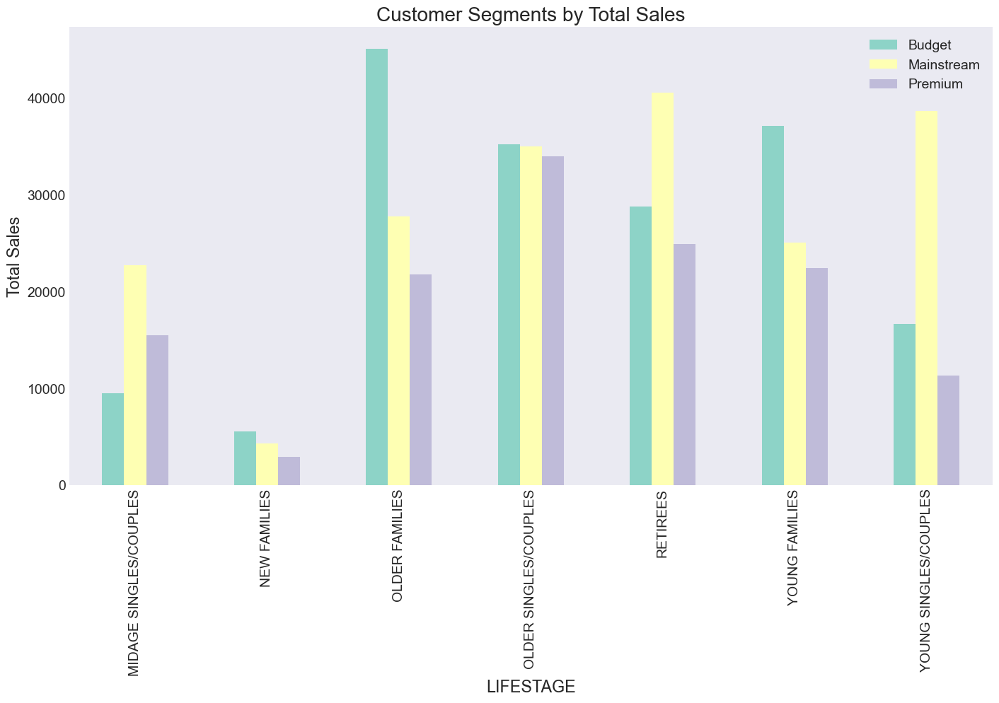

In [85]:
tot_plot = pd.DataFrame(com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).TOT_SALES.sum())
plt.style.use('seaborn-dark')
prod_plot.unstack().plot(kind='bar', figsize=(15,8), title='Customer Segments by Total Sales')
plt.ylabel("Total Sales")
plt.legend(['Budget', 'Mainstream', 'Premium'])

The total sales trends here are similar to the trends of the porduct quantities. 

In order to better analyze the above results from the product quantity and price, we will investigate the average number of units per customer and price per unit in each of the customer segment.

#### Customer Segments based on Average Product Quantities per Customer

In [86]:
com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).PROD_QTY.sum()

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget               9496
                        Mainstream          22699
                        Premium             15526
NEW FAMILIES            Budget               5571
                        Mainstream           4319
                        Premium              2957
OLDER FAMILIES          Budget              45065
                        Mainstream          27756
                        Premium             21771
OLDER SINGLES/COUPLES   Budget              35220
                        Mainstream          34997
                        Premium             33986
RETIREES                Budget              28764
                        Mainstream          40518
                        Premium             24884
YOUNG FAMILIES          Budget              37111
                        Mainstream          25044
                        Premium             22406
YOUNG SINGLES/COUPLES   Budget              16671
         

In [87]:
com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).LYLTY_CARD_NBR.nunique()

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget              1504
                        Mainstream          3340
                        Premium             2431
NEW FAMILIES            Budget              1112
                        Mainstream           849
                        Premium              588
OLDER FAMILIES          Budget              4675
                        Mainstream          2831
                        Premium             2273
OLDER SINGLES/COUPLES   Budget              4929
                        Mainstream          4930
                        Premium             4750
RETIREES                Budget              4454
                        Mainstream          6479
                        Premium             3872
YOUNG FAMILIES          Budget              4017
                        Mainstream          2728
                        Premium             2433
YOUNG SINGLES/COUPLES   Budget              3779
                        Main

In [88]:
avg_units_per_cust = com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).PROD_QTY.sum()/com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).LYLTY_CARD_NBR.nunique()
avg_units_per_cust

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget              6.313830
                        Mainstream          6.796108
                        Premium             6.386672
NEW FAMILIES            Budget              5.009892
                        Mainstream          5.087161
                        Premium             5.028912
OLDER FAMILIES          Budget              9.639572
                        Mainstream          9.804309
                        Premium             9.578091
OLDER SINGLES/COUPLES   Budget              7.145466
                        Mainstream          7.098783
                        Premium             7.154947
RETIREES                Budget              6.458015
                        Mainstream          6.253743
                        Premium             6.426653
YOUNG FAMILIES          Budget              9.238486
                        Mainstream          9.180352
                        Premium             9.209207
YOUNG

In [89]:
avg_units_per_cust = pd.DataFrame(avg_units_per_cust, columns={'Avg number of Units per Customer'})
avg_units_per_cust.sort_values(by='Avg number of Units per Customer',ascending=False, inplace=True)
avg_units_per_cust

Avg number of Units per Customer
LIFESTAGE              PREMIUM_CUSTOMER                                  
OLDER FAMILIES         Mainstream                                9.804309
                       Budget                                    9.639572
                       Premium                                   9.578091
YOUNG FAMILIES         Budget                                    9.238486
                       Premium                                   9.209207
                       Mainstream                                9.180352
OLDER SINGLES/COUPLES  Premium                                   7.154947
                       Budget                                    7.145466
                       Mainstream                                7.098783
MIDAGE SINGLES/COUPLES Mainstream                                6.796108
RETIREES               Budget                                    6.458015
                       Premium                                   6.426653
MIDAGE SINGLES/COUPLES Premium                                   6.386672
                       Budget                                    6.313830
RETIREES               Mainstream                                6.253743
NEW FAMILIES           Mainstream                                5.087161
                       Premium                                   5.028912
                       Budget                                    5.009892
YOUNG SINGLES/COUPLES  Mainstream                                4.776459
                       Budget                                    4.411485
                       Premium                                   4.402098

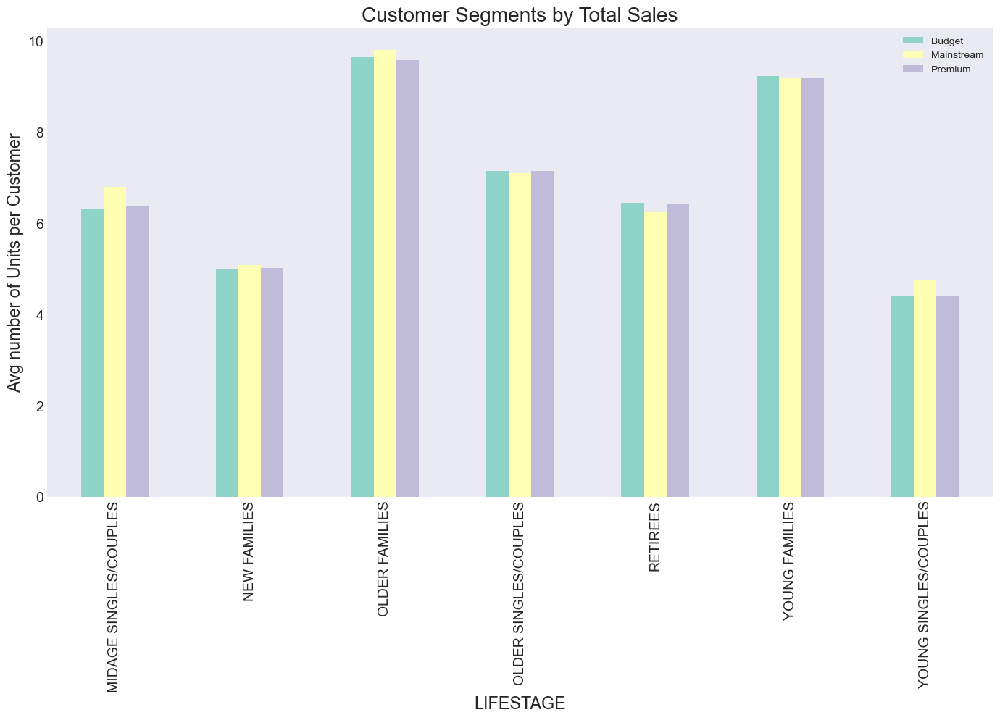

In [90]:
avg_units_per_cust.unstack().plot(kind='bar', figsize=(15,8), title='Customer Segments by Total Sales')
plt.style.use('ggplot')
plt.ylabel("Avg number of Units per Customer")
plt.legend(['Budget', 'Mainstream', 'Premium'])

As it obvious from the chart above that older and young families are contributing more when it comes to buy number of chips per customer.

#### Customer Segments based on Price per Unit

In [91]:
com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).TOT_SALES.sum()

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget               35514.80
                        Mainstream           90803.85
                        Premium              58432.65
NEW FAMILIES            Budget               21928.45
                        Mainstream           17013.90
                        Premium              11491.10
OLDER FAMILIES          Budget              168363.25
                        Mainstream          103445.55
                        Premium              80658.40
OLDER SINGLES/COUPLES   Budget              136769.80
                        Mainstream          133393.80
                        Premium             132263.15
RETIREES                Budget              113147.80
                        Mainstream          155677.05
                        Premium              97646.05
YOUNG FAMILIES          Budget              139345.85
                        Mainstream           92788.75
                        Premium          

In [92]:
price_per_unit = com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).TOT_SALES.sum()/com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).PROD_QTY.sum()
price_per_unit = pd.DataFrame(price_per_unit, columns={'Price per Unit'})
price_per_unit.sort_values(by='Price per Unit',ascending=False, inplace=True)
price_per_unit

Price per Unit
LIFESTAGE              PREMIUM_CUSTOMER                
YOUNG SINGLES/COUPLES  Mainstream              4.080079
MIDAGE SINGLES/COUPLES Mainstream              4.000346
NEW FAMILIES           Mainstream              3.939315
                       Budget                  3.936178
RETIREES               Budget                  3.933660
                       Premium                 3.924050
OLDER SINGLES/COUPLES  Premium                 3.891695
NEW FAMILIES           Premium                 3.886067
OLDER SINGLES/COUPLES  Budget                  3.883299
RETIREES               Mainstream              3.842170
OLDER SINGLES/COUPLES  Mainstream              3.811578
MIDAGE SINGLES/COUPLES Premium                 3.763535
YOUNG FAMILIES         Budget                  3.754840
                       Premium                 3.750134
MIDAGE SINGLES/COUPLES Budget                  3.739975
OLDER FAMILIES         Budget                  3.736009
                       Mainstream              3.726962
YOUNG FAMILIES         Mainstream              3.705029
OLDER FAMILIES         Premium                 3.704855
YOUNG SINGLES/COUPLES  Premium                 3.675060
                       Budget                  3.667542

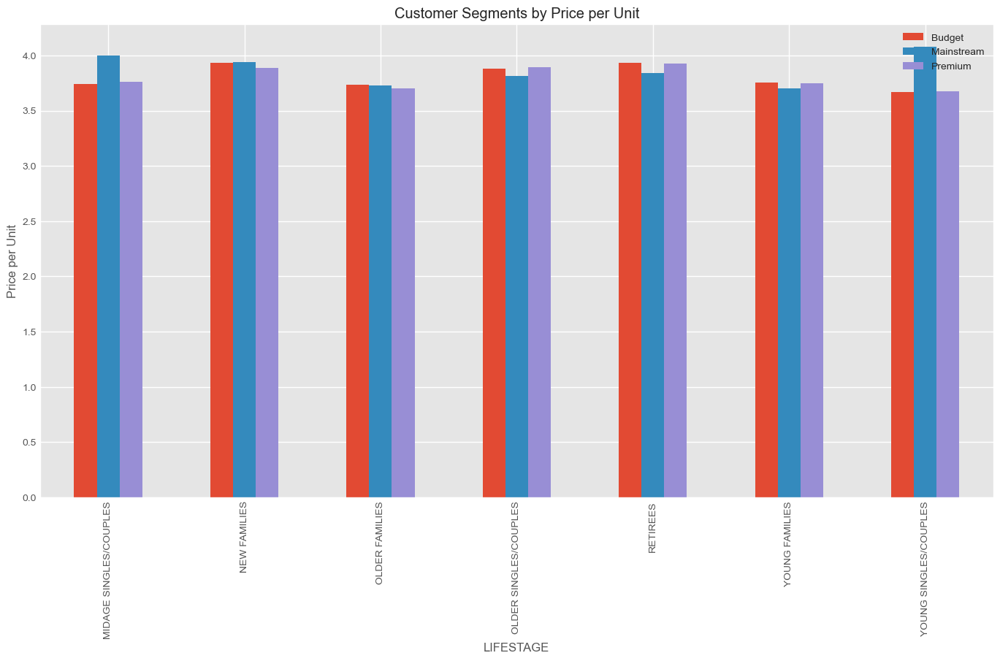

In [93]:
price_per_unit.unstack().plot(kind='bar', figsize=(15,8), title='Customer Segments by Price per Unit')
plt.style.use('bmh')
plt.ylabel("Price per Unit")
plt.legend(['Budget', 'Mainstream', 'Premium'])

Mainstream midage and young singles and couples are more willing to pay more per packet of chips compared to their budget and premium counterparts. This may be due to premium shoppers being more likely to buy healthy snacks and when they do buy chips, it is mainly for entertainment purposes rather than their own consumption. This is also supported by there being fewer premium midage and young singles and couples buying chips compared to their mainstream counterparts.

#### Customer Segments based on Pack Size

In [94]:
cust_ps = pd.DataFrame(com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).PACK_SIZE.mean())
cust_ps.rename(columns={'PACK_SIZE':'Avg Pack Size'},inplace=True)
cust_ps.sort_values(by='Avg Pack Size',ascending=False, inplace=True)
cust_ps

Avg Pack Size
PREMIUM_CUSTOMER LIFESTAGE                            
Mainstream       YOUNG SINGLES/COUPLES      184.828330
                 MIDAGE SINGLES/COUPLES     184.582786
Premium          OLDER SINGLES/COUPLES      183.254534
                 RETIREES                   182.975260
Budget           RETIREES                   182.960200
                 YOUNG FAMILIES             182.490901
                 OLDER FAMILIES             182.487219
                 OLDER SINGLES/COUPLES      182.289183
Mainstream       RETIREES                   182.289062
                 OLDER FAMILIES             182.175021
                 NEW FAMILIES               181.699355
                 OLDER SINGLES/COUPLES      181.642101
Premium          MIDAGE SINGLES/COUPLES     181.577897
Mainstream       YOUNG FAMILIES             181.536531
Premium          OLDER FAMILIES             181.432618
                 YOUNG FAMILIES             181.351985
                 NEW FAMILIES               181.286973
Budget           NEW FAMILIES               181.161730
Premium          YOUNG SINGLES/COUPLES      181.056042
Budget           YOUNG SINGLES/COUPLES      180.694438
                 MIDAGE SINGLES/COUPLES     180.187450

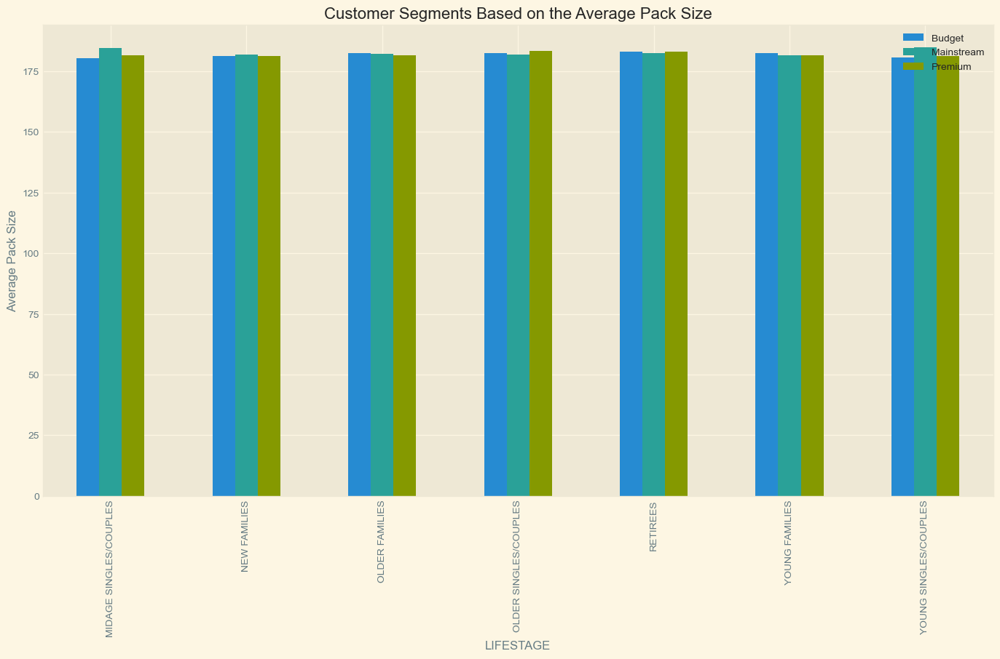

In [95]:
ps_plot = pd.DataFrame(com_dfs.groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).PACK_SIZE.mean())
matplotlib.style.use('Solarize_Light2')
ps_plot.unstack().plot(kind='bar', figsize=(15,8), title='Customer Segments Based on the Average Pack Size')
plt.ylabel("Average Pack Size")
plt.legend(['Budget', 'Mainstream', 'Premium'])

Mainstream young and midage singles and couples are buying the highest average size of chips among the customers' segments.

In [96]:
com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).BRAND.value_counts()

PREMIUM_CUSTOMER  LIFESTAGE               BRAND    
Budget            MIDAGE SINGLES/COUPLES  Kettle       713
                                          Smiths       633
                                          Doritos      533
                                          Pringles     449
                                          Infuzions    281
                                                      ... 
Premium           YOUNG SINGLES/COUPLES   Cheetos       80
                                          Burger        57
                                          GrnWves       48
                                          French        45
                                          NCC           44
Name: BRAND, Length: 525, dtype: int64

In [97]:
cust_b = pd.DataFrame(com_dfs.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).BRAND.value_counts())
cust_b

BRAND
PREMIUM_CUSTOMER LIFESTAGE              BRAND           
Budget           MIDAGE SINGLES/COUPLES Kettle       713
                                        Smiths       633
                                        Doritos      533
                                        Pringles     449
                                        Infuzions    281
...                                                  ...
Premium          YOUNG SINGLES/COUPLES  Cheetos       80
                                        Burger        57
                                        GrnWves       48
                                        French        45
                                        NCC           44

[525 rows x 1 columns]

In [98]:
cust_b.rename(columns={'BRAND':'Counts'}, inplace=True)
cust_b.columns

Index(['Counts'], dtype='object')

In [99]:
len(com_dfs['PREMIUM_CUSTOMER'].unique()),len(com_dfs['LIFESTAGE'].unique()), len(com_dfs['BRAND'].unique()), len(cust_b)

(3, 7, 25, 525)

We have 3 unique values in PREMIUM_CUSTOMER, 7 in LIFESTAGE, 25 in BRAND, and the length of the cust_b dataframe is 525. If we divide 525 by 25 we will get 21 which is also the multiplication product of 3 by 7. This means that every brand of chips is existing in the different combination of the PREMIUM_CUSTOMER and LIFESTAGE and at the top the most popular brand in that segment exist. We can extract the most popular brand in each segment from cust_b dataframe by using for loop. 

In [100]:
cust_b.head(64)

Counts
PREMIUM_CUSTOMER LIFESTAGE              BRAND                
Budget           MIDAGE SINGLES/COUPLES Kettle            713
                                        Smiths            633
                                        Doritos           533
                                        Pringles          449
                                        Infuzions         281
...                                                       ...
                 OLDER FAMILIES         Cobs              760
                                        Old               758
                                        Tostitos          705
                                        Red Rock Deli     639
                                        Natural           576

[64 rows x 1 columns]

In [101]:
l = []
for i in range(21):
    l.append(cust_b.index[25*i])
print(l)

[('Budget', 'MIDAGE SINGLES/COUPLES', 'Kettle'), ('Budget', 'NEW FAMILIES', 'Kettle'), ('Budget', 'OLDER FAMILIES', 'Kettle'), ('Budget', 'OLDER SINGLES/COUPLES', 'Kettle'), ('Budget', 'RETIREES', 'Kettle'), ('Budget', 'YOUNG FAMILIES', 'Kettle'), ('Budget', 'YOUNG SINGLES/COUPLES', 'Smiths'), ('Mainstream', 'MIDAGE SINGLES/COUPLES', 'Kettle'), ('Mainstream', 'NEW FAMILIES', 'Kettle'), ('Mainstream', 'OLDER FAMILIES', 'Kettle'), ('Mainstream', 'OLDER SINGLES/COUPLES', 'Kettle'), ('Mainstream', 'RETIREES', 'Kettle'), ('Mainstream', 'YOUNG FAMILIES', 'Kettle'), ('Mainstream', 'YOUNG SINGLES/COUPLES', 'Kettle'), ('Premium', 'MIDAGE SINGLES/COUPLES', 'Kettle'), ('Premium', 'NEW FAMILIES', 'Kettle'), ('Premium', 'OLDER FAMILIES', 'Smiths'), ('Premium', 'OLDER SINGLES/COUPLES', 'Kettle'), ('Premium', 'RETIREES', 'Kettle'), ('Premium', 'YOUNG FAMILIES', 'Kettle'), ('Premium', 'YOUNG SINGLES/COUPLES', 'Kettle')]


In [102]:
customer_best_brand = pd.DataFrame(l, columns=['PREMIUM_CUSTOMER', 'LIFESTAGE', 'Best Brand'])
customer_best_brand

,PREMIUM_CUSTOMER,LIFESTAGE,Best Brand
0,Budget,MIDAGE SINGLES/COUPLES,Kettle
1,Budget,NEW FAMILIES,Kettle
2,Budget,OLDER FAMILIES,Kettle
3,Budget,OLDER SINGLES/COUPLES,Kettle
4,Budget,RETIREES,Kettle
5,Budget,YOUNG FAMILIES,Kettle
6,Budget,YOUNG SINGLES/COUPLES,Smiths
7,Mainstream,MIDAGE SINGLES/COUPLES,Kettle
8,Mainstream,NEW FAMILIES,Kettle
9,Mainstream,OLDER FAMILIES,Kettle


# CONCLUSION


Let’s recap what we’ve found!
Sales have mainly been due to Budget - older families, Mainstream - young singles/couples, and Mainstream retirees shoppers.
The high spend in chips for mainstream young singles/couples and retirees is due to there being more of them than other buyers.
Mainstream young singles and couples are 23% more likely to purchase Tyrrells chipscompared to the rest of the population. 

SMITHS PREFERRED BY BUDGET YOUNG AUDIENCE AND PREMIUM OLDER FAMILIES

KETTLE PREFERRED BY EVERYONE ELSE

The Category Manager may want to increase the category’s performance by off-locating some Tyrrells and smaller packs of chips in discretionary space near segments where young singles and couples frequent more often to increase visibilty and impulse behaviour

# END OF EXPLORATORY ANALYSIS FOR TASK 1